In [3]:
import pandas as pd

train_df = pd.read_csv('./data/train.csv')

In [3]:
# print info
print(train_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15696 entries, 0 to 15695
Data columns (total 51 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   name                                          15696 non-null  object 
 1   description                                   15309 non-null  object 
 2   property_type                                 15696 non-null  object 
 3   price                                         15696 non-null  int64  
 4   neighbourhood_cleansed                        15696 non-null  object 
 5   neighbourhood_group_cleansed                  15696 non-null  object 
 6   latitude                                      15696 non-null  float64
 7   longitude                                     15696 non-null  float64
 8   host_since                                    15696 non-null  object 
 9   host_response_time                            13493 non-null 

In [4]:
# check for null values
print(train_df.isnull().sum())

name                                               0
description                                      387
property_type                                      0
price                                              0
neighbourhood_cleansed                             0
neighbourhood_group_cleansed                       0
latitude                                           0
longitude                                          0
host_since                                         0
host_response_time                              2203
host_response_rate                              2203
host_acceptance_rate                            2053
host_is_superhost                                251
host_listings_count                                0
host_total_listings_count                          0
host_verifications                                 0
host_has_profile_pic                               0
host_identity_verified                             0
calculated_host_listings_count                

In [4]:
# check if the number of reviews is 0 for missing reviews
# Step 1: Filter rows where 'reviews' is null
missing_reviews = train_df[train_df['reviews'].isnull()]

# Step 2: Check how many have 'number_of_reviews' equal to 0
matching_rows = missing_reviews[missing_reviews['number_of_reviews'] == 0]

# Step 3: Count the matches
count_matches = len(matching_rows)

# Output the result
print(f"Number of rows with missing reviews and number_of_reviews = 0: {count_matches}")


Number of rows with missing reviews and number_of_reviews = 0: 4474


In [5]:
# describe dataset
print(train_df.describe())

              price      latitude     longitude  host_response_rate  \
count  15696.000000  15696.000000  15696.000000        13493.000000   
mean       2.465724     40.726899    -73.943147           91.383013   
std        1.709624      0.058079      0.060149           22.320590   
min        0.000000     40.500366    -74.251907            0.000000   
25%        1.000000     40.685686    -73.983133           97.000000   
50%        2.000000     40.725251    -73.952458          100.000000   
75%        4.000000     40.762314    -73.921120          100.000000   
max        5.000000     40.911390    -73.713650          100.000000   

       host_acceptance_rate  host_listings_count  host_total_listings_count  \
count          13643.000000         15696.000000               15696.000000   
mean              78.579198           288.106588                 393.435143   
std               27.896484           984.327077                1205.427544   
min                0.000000             1.00

In [7]:
print(train_df.isnull().sum().sort_values(ascending=False))


review_scores_location                          4475
review_scores_communication                     4474
review_scores_checkin                           4474
review_scores_cleanliness                       4474
review_scores_value                             4474
reviews                                         4474
review_scores_rating                            4474
review_scores_accuracy                          4474
reviews_per_month                               4474
first_review                                    4474
last_review                                     4474
host_response_rate                              2203
host_response_time                              2203
host_acceptance_rate                            2053
description                                      387
host_is_superhost                                251
has_availability                                 118
beds                                              84
bedrooms                                      

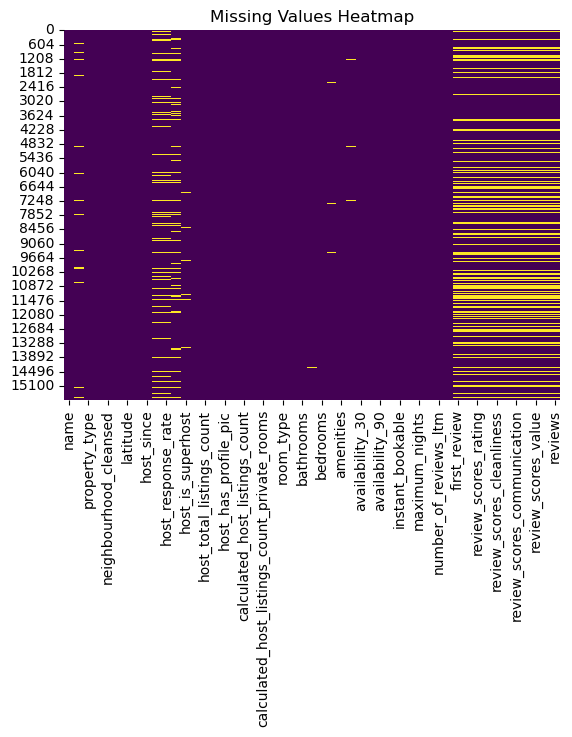

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(train_df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()


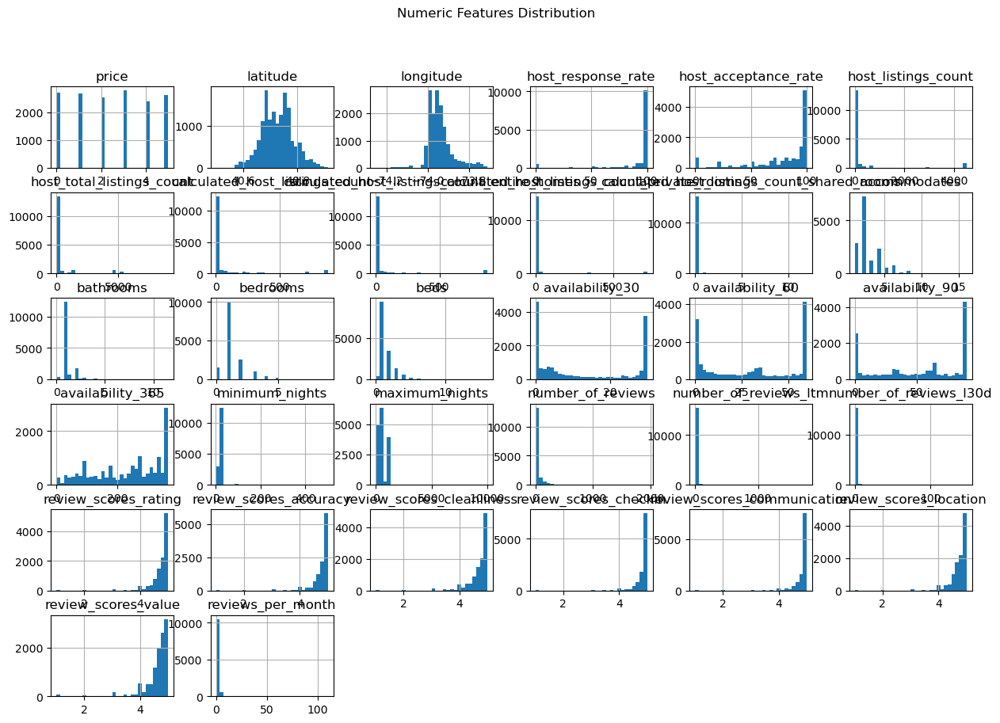

In [11]:
numeric_cols = train_df.select_dtypes(include=['float64', 'int64']).columns
train_df[numeric_cols].hist(figsize=(15, 10), bins=30)
plt.suptitle('Numeric Features Distribution')
plt.show()


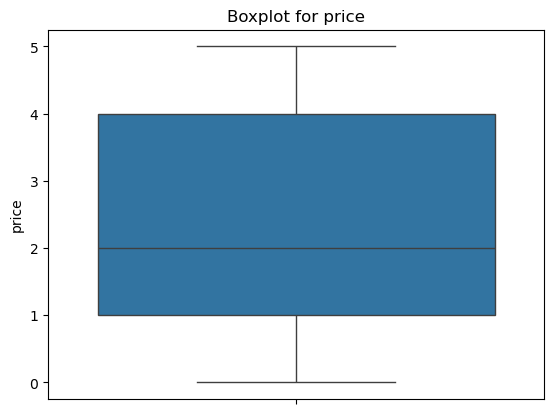

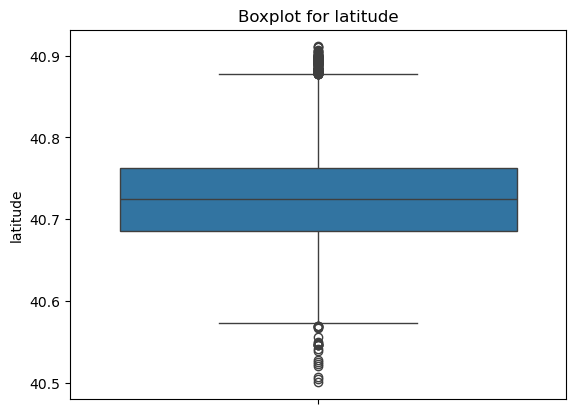

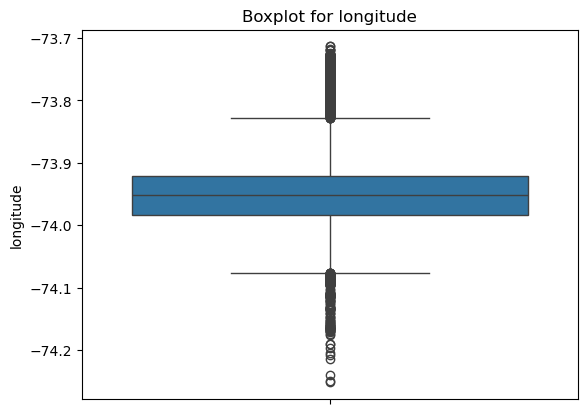

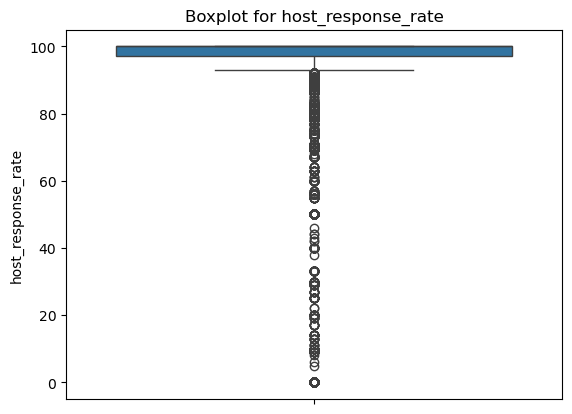

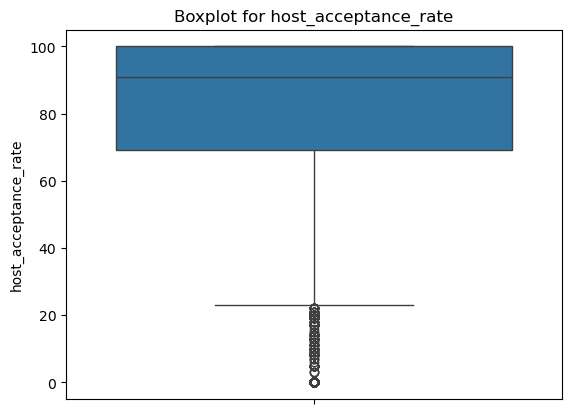

...

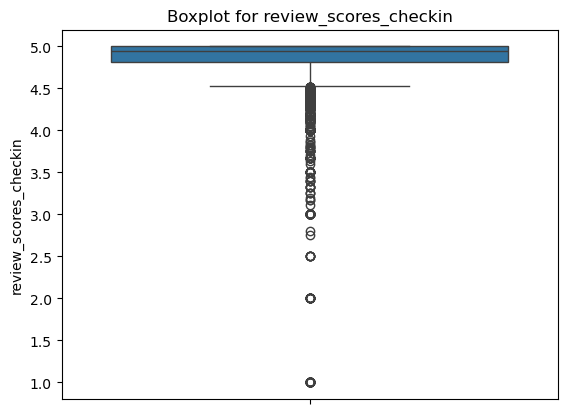

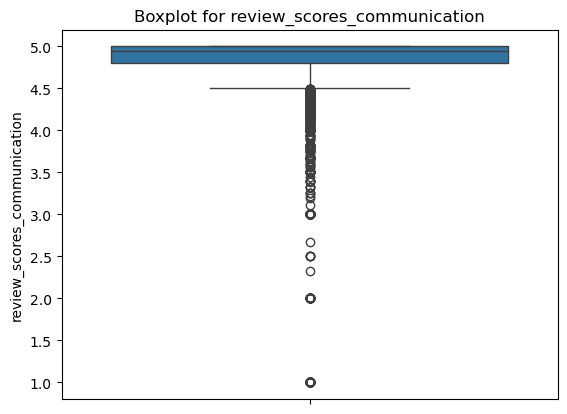

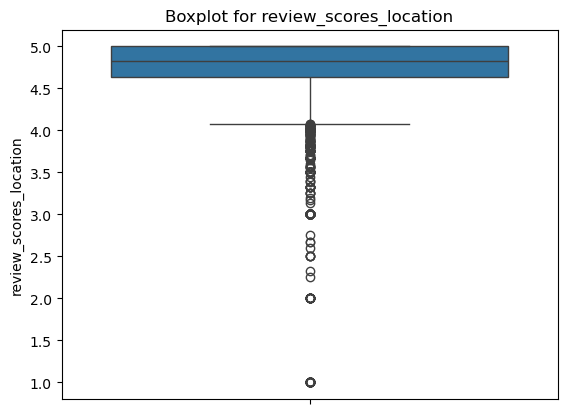

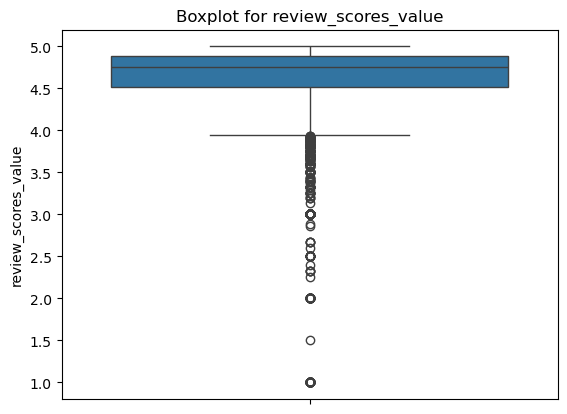

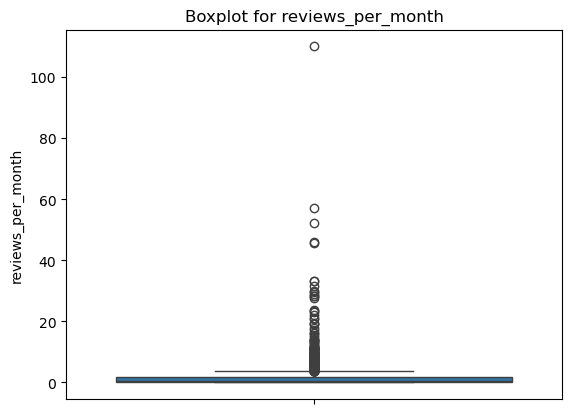

In [13]:
for col in numeric_cols:
    sns.boxplot(train_df[col])
    plt.title(f"Boxplot for {col}")
    plt.show()


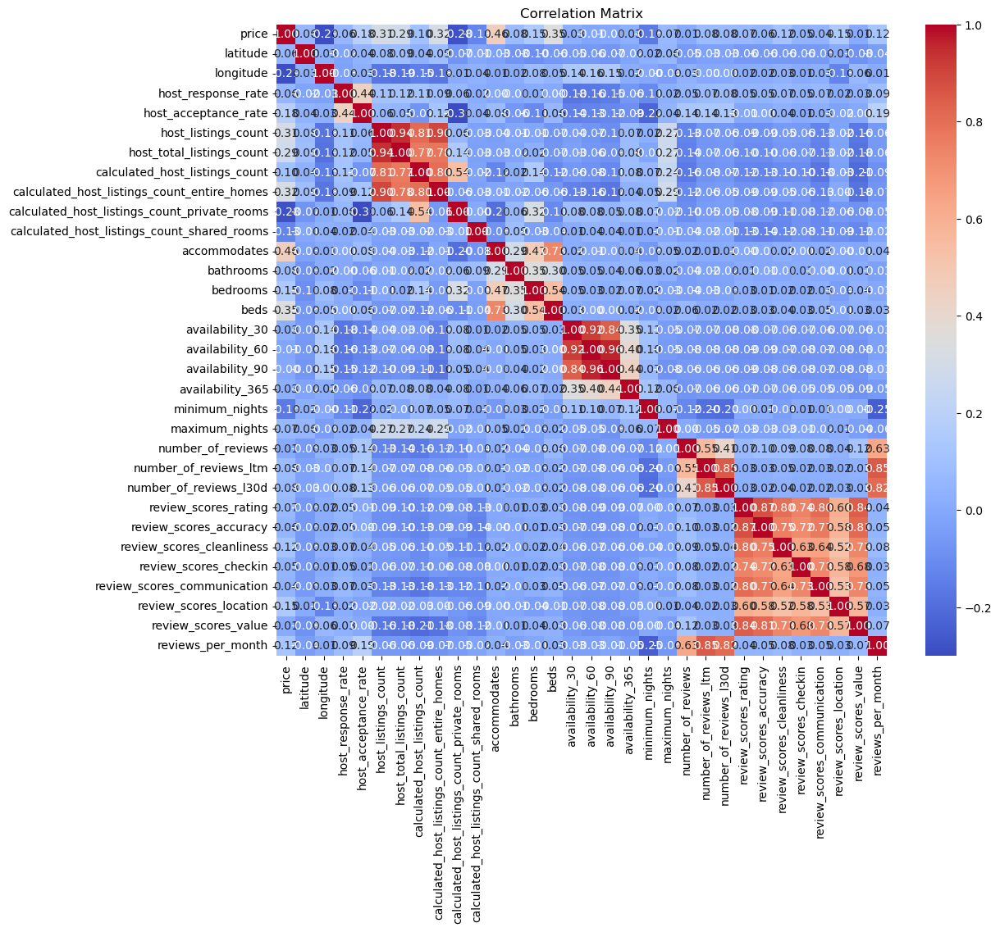

In [16]:
correlation = train_df[numeric_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [32]:
corr = train_df[numeric_cols].corr()
print(corr['price'].sort_values(ascending=False))  # Check most correlated features


price                                           1.000000
accommodates                                    0.461269
beds                                            0.345799
calculated_host_listings_count_entire_homes     0.317481
host_listings_count                             0.310123
host_total_listings_count                       0.286618
host_acceptance_rate                            0.182712
bedrooms                                        0.149484
review_scores_location                          0.147855
reviews_per_month                               0.123218
review_scores_cleanliness                       0.115391
calculated_host_listings_count                  0.104923
number_of_reviews_ltm                           0.077814
bathrooms                                       0.076524
number_of_reviews_l30d                          0.075622
maximum_nights                                  0.069648
review_scores_rating                            0.067670
host_response_rate             

In [22]:
categorical_cols = train_df.select_dtypes(include=['object', 'category']).columns
for col in categorical_cols:
    print(f"{col}: {train_df[col].nunique()} unique values")
    print(train_df[col].value_counts().head())


name: 15189 unique values
name
Private bedroom -3 mins to shopping center         16
Wyndham Midtown 45 | 2BR/2BA King Bed Suite        11
Wyndham Midtown 45 Resort | King Bed Hotel Room    10
Wyndham Midtown 45 | 1BR/1BA King Bed Suite        10
Blueground | FiDi, gym, nr Freedom Tower            9
Name: count, dtype: int64
description: 12687 unique values
description
Kick back and relax in this calm, stylish space.                                           55
Keep it simple at this peaceful and centrally-located place.                               55
Forget your worries in this spacious and serene space.                                     52
Enjoy a stylish experience at this centrally-located place.                                49
The whole group will enjoy easy access to everything from this centrally located place.    49
Name: count, dtype: int64
property_type: 59 unique values
property_type
Entire rental unit             6516
Private room in rental unit    3943
Private room i

In [37]:
# more specific analysis of bathroom types
print(train_df['bathrooms_text'].unique())


special_cases = {
    'Half-bath': 0.5,
    'Private half-bath': 0.5,
    'Shared half-bath': 0.5
}

df['bathrooms_numeric'] = (
    df['bathrooms_text']
    .replace(special_cases)  # Replace special cases with numeric equivalents
    .str.extract(r'(\d+\.?\d*)')  # Extract numeric values (integers or decimals)
    .astype(float)  # Convert to float
)

print(train_df['bathrooms_text'].str.extract('(\d+)').astype(float).head())

# conclusion: extract numbers, maybe included flag for shared/private


['2 baths' '1 private bath' '1 bath' '1.5 baths' '1 shared bath'
 '0 shared baths' '2 shared baths' '1.5 shared baths' '0 baths'
 '2.5 shared baths' '3 baths' 'Half-bath' '5 baths' '2.5 baths'
 '3 shared baths' '3.5 baths' '4 baths' nan '10.5 baths'
 'Private half-bath' '4 shared baths' '7 baths' '4.5 baths' '5.5 baths'
 '3.5 shared baths' 'Shared half-bath' '6 shared baths' '11.5 baths'
 '5 shared baths' '6 baths' '4.5 shared baths']


NameError: name 'df' is not defined

In [8]:
# more specific analysis of property types
print(train_df['property_type'].value_counts())
print(train_df['room_type'].value_counts())


property_type
Entire rental unit                    6516
Private room in rental unit           3943
Private room in home                  1295
Entire home                            716
Private room in townhouse              480
Entire condo                           474
Room in hotel                          432
Private room in condo                  236
Entire townhouse                       216
Entire guest suite                     195
Entire loft                            172
Entire serviced apartment              144
Room in boutique hotel                 124
Shared room in rental unit             112
Private room in serviced apartment      99
Private room in guest suite             87
Private room in loft                    55
Entire place                            46
Private room in bed and breakfast       40
Room in aparthotel                      39
Private room in casa particular         31
Shared room in home                     31
Entire guesthouse                       

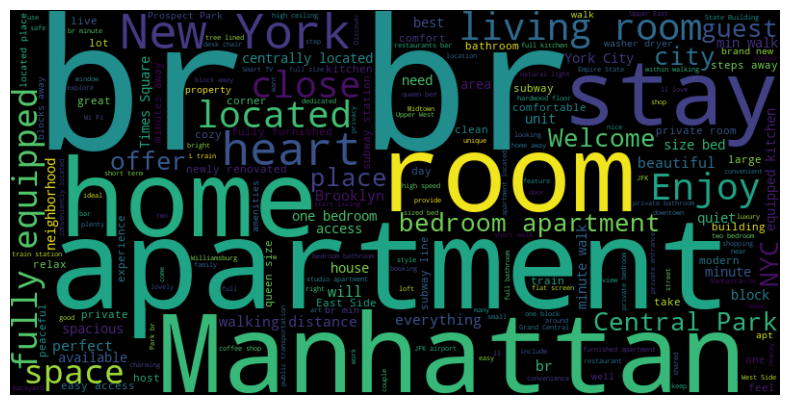

In [25]:
from wordcloud import WordCloud

text = ' '.join(train_df['description'].dropna())
wordcloud = WordCloud(width=800, height=400).generate(text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


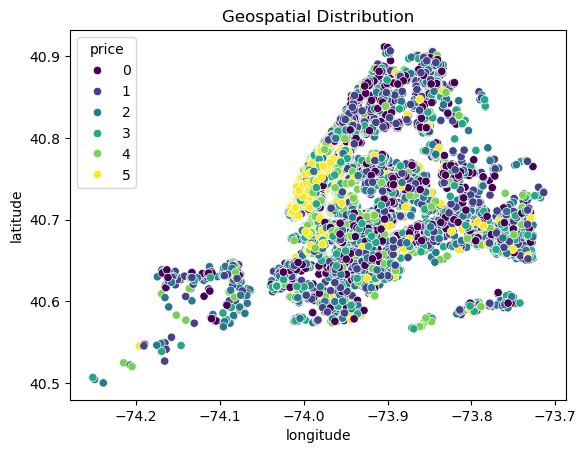

In [27]:
sns.scatterplot(x=train_df['longitude'], y=train_df['latitude'], hue=train_df['price'], palette='viridis')
plt.title('Geospatial Distribution')
plt.show()


In [29]:
sns.pairplot(train_df[numeric_cols])
plt.suptitle('Pairplot for Numeric Features', y=1.02)
plt.show()


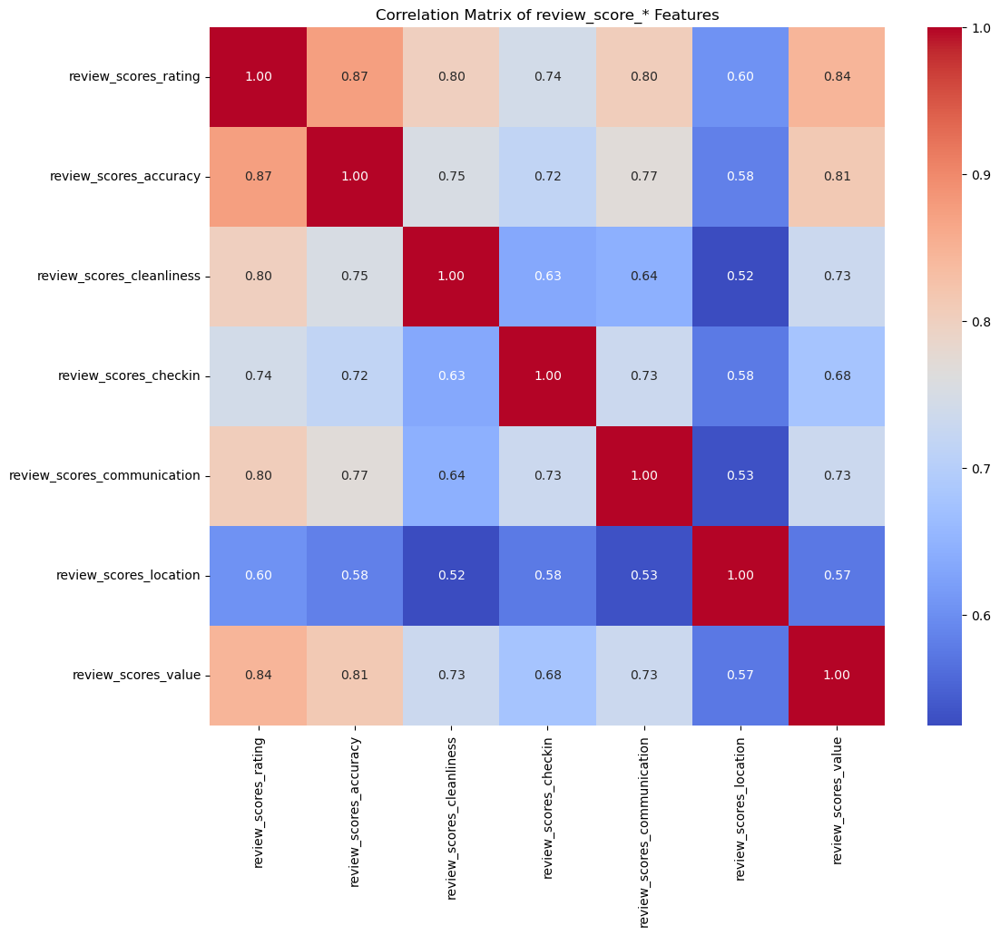

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select review_score_* columns
review_scores = train_df.filter(like='review_scores_').columns

# Compute correlation matrix
correlation_matrix = train_df[review_scores].corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of review_score_* Features')
plt.show()
